### Import Required Libraries

In [1]:
# Import libraries

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from skimage.io import imread
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

from tensorflow.image import resize
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping

from keras.preprocessing import image
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.callbacks import ReduceLROnPlateau
from keras import backend as K
from keras import optimizers

import itertools
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, log_loss

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from keras.layers import GlobalAveragePooling2D

### Load Dataset

In [2]:
skin_dir = "data"

imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(skin_dir, '*', '*.jpg'))}

lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'dermatofibroma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}


In [3]:
# Read the CSV file
skin_df = pd.read_csv(os.path.join(skin_dir, 'HAM10000_metadata.csv'))

# Map the image paths and cell types to the dataframe
skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 

# Convert cell types to categorical codes
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes

# Sample three random rows
skin_df.sample(5)

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
795,HAM_0005632,ISIC_0029232,bkl,confocal,85.0,female,face,data\HAM10000_images_part_1\ISIC_0029232.jpg,Benign keratosis-like lesions,2
3355,HAM_0006270,ISIC_0031606,nv,follow_up,55.0,female,lower extremity,data\HAM10000_images_part_2\ISIC_0031606.jpg,Melanocytic nevi,4
9118,HAM_0007014,ISIC_0027798,nv,histo,45.0,female,abdomen,data\HAM10000_images_part_1\ISIC_0027798.jpg,Melanocytic nevi,4
5957,HAM_0006943,ISIC_0027336,nv,follow_up,55.0,male,lower extremity,data\HAM10000_images_part_1\ISIC_0027336.jpg,Melanocytic nevi,4
4878,HAM_0004276,ISIC_0029622,nv,follow_up,40.0,female,genital,data\HAM10000_images_part_2\ISIC_0029622.jpg,Melanocytic nevi,4


### Data Evaluation and Pre-processing

In [4]:
skin_df.describe(exclude=[np.number])

,lesion_id,image_id,dx,dx_type,sex,localization,path,cell_type
count,10015,10015,10015,10015,10015,10015,10015,10015
unique,7470,10015,7,4,3,15,10015,7
top,HAM_0003789,ISIC_0027419,nv,histo,male,back,data\HAM10000_images_part_1\ISIC_0027419.jpg,Melanocytic nevi
freq,6,1,6705,5340,5406,2192,1,6705


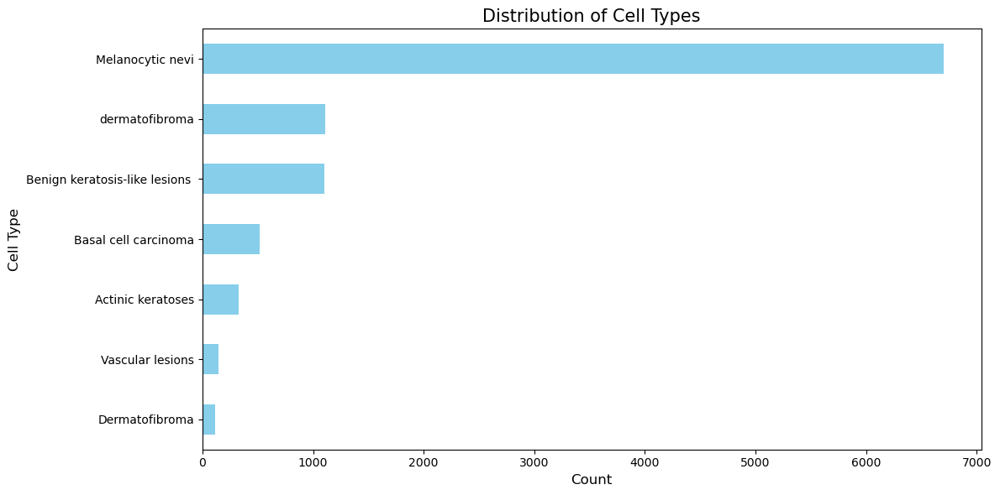

In [5]:
# Set the figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot the value counts for 'cell_type'
skin_df['cell_type'].value_counts().sort_values(ascending=True).plot(kind='barh', ax=ax1, color='skyblue')

# Set the title and labels
ax1.set_title('Distribution of Cell Types', fontsize=15)
ax1.set_xlabel('Count', fontsize=12)
ax1.set_ylabel('Cell Type', fontsize=12)

# Display the plot
plt.tight_layout()
plt.show()


* We can see that the classes are not evenly distributed with Melanoytic nevi way larger than the other class. so we need to find a way to balance this

In [6]:
# load in all of the images
skin_df['image'] = skin_df['path'].map(imread)

In [7]:
# Check the image size distribution
image_size_distribution = skin_df['image'].map(lambda x: x.shape).value_counts()
print(image_size_distribution)

(450, 600, 3)    10015
Name: image, dtype: int64


##### Let's show off image in all categories

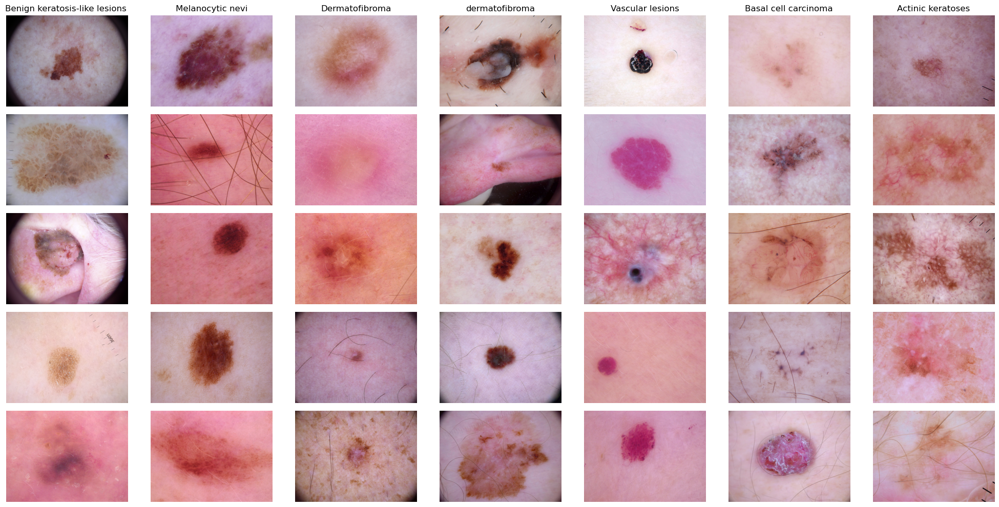

In [8]:
# Get unique cell types
unique_cell_types = skin_df['cell_type'].unique()

# Number of random samples per category
samples_per_category = 5

fig, axarr = plt.subplots(nrows=samples_per_category, ncols=len(unique_cell_types), figsize=(20, 10))

for i, cell_type in enumerate(unique_cell_types):
    # Get 5 random images for this cell type
    random_samples = skin_df[skin_df['cell_type'] == cell_type].sample(samples_per_category)
    
    for j, (_, sample_row) in enumerate(random_samples.iterrows()):
        axarr[j, i].imshow(sample_row['image'])
        axarr[j, i].axis('off')
        
        # Set the title only for the top row
        if j == 0:
            axarr[j, i].set_title(cell_type)

plt.tight_layout()
plt.show()


In [9]:
# this will tell us how many images are associated with each lesion_id
skin_undup = skin_df.groupby('lesion_id').count()
# now we filter out lesion_id's that have only one image associated with it
skin_undup = skin_undup[skin_undup['image_id'] == 1]
skin_undup.reset_index(inplace=True)
skin_undup.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx,image
0,HAM_0000001,1,1,1,1,1,1,1,1,1,1
1,HAM_0000003,1,1,1,1,1,1,1,1,1,1
2,HAM_0000004,1,1,1,1,1,1,1,1,1,1
3,HAM_0000007,1,1,1,1,1,1,1,1,1,1
4,HAM_0000008,1,1,1,1,1,1,1,1,1,1


##### Remove duplicates

In [10]:
# here we identify lesion_id's that have duplicate images and those that have only one image.
def get_duplicates(x):
    unique_list = list(skin_undup['lesion_id'])
    if x in unique_list:
        return 'unduplicated'
    else:
        return 'duplicated'

# create a new column that is a copy of the lesion_id column
skin_df['duplicates'] = skin_df['lesion_id']
# apply the function to this new column
skin_df['duplicates'] = skin_df['duplicates'].apply(get_duplicates)
skin_df.head()


,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx,image,duplicates
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,data\HAM10000_images_part_1\ISIC_0027419.jpg,Benign keratosis-like lesions,2,"[[[188, 147, 191], [186, 148, 189], [187, 150,...",duplicated
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,data\HAM10000_images_part_1\ISIC_0025030.jpg,Benign keratosis-like lesions,2,"[[[25, 15, 23], [25, 14, 22], [25, 14, 22], [2...",duplicated
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,data\HAM10000_images_part_1\ISIC_0026769.jpg,Benign keratosis-like lesions,2,"[[[186, 128, 140], [188, 128, 136], [183, 126,...",duplicated
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,data\HAM10000_images_part_1\ISIC_0025661.jpg,Benign keratosis-like lesions,2,"[[[24, 9, 16], [22, 11, 15], [23, 11, 15], [26...",duplicated
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,data\HAM10000_images_part_2\ISIC_0031633.jpg,Benign keratosis-like lesions,2,"[[[122, 80, 102], [124, 82, 104], [127, 83, 10...",duplicated


In [11]:
skin_df['duplicates'].value_counts()

unduplicated    5514
duplicated      4501
Name: duplicates, dtype: int64

In [12]:
# now we filter out images so that we don't have duplicates
skin_undup = skin_df[skin_df['duplicates'] == 'unduplicated']
skin_undup.shape

(5514, 12)

In [13]:
# Creating a validation set using skin_undup, ensuring that the validation set contains only unique images without augmented duplicates.
y = skin_undup['cell_type_idx']
_, skin_val = train_test_split(skin_undup, test_size=0.25, random_state=7, stratify=y)
skin_val.shape


(1379, 12)

In [14]:
skin_val['cell_type_idx'].value_counts()

4    1104
2     110
6      57
1      44
0      38
5      16
3      10
Name: cell_type_idx, dtype: int64

In [15]:
# This set will be skin_df excluding all rows that are in the val set.
# The function identifies if an image is part of the train or val set.
def get_val_rows(x):
    # create a list of all the image_id's in the val set
    val_list = list(skin_val['image_id'])
    if str(x) in val_list:
        return 'val'
    else:
        return 'train'

# identify which rows in skin_df are part of train and which are part of val
# create a new column that is a copy of the image_id column
skin_df['train_or_val'] = skin_df['image_id']
# apply the function to this new column to categorize each row
skin_df['train_or_val'] = skin_df['train_or_val'].apply(get_val_rows)
# filter out rows that belong to the train set
skin_train = skin_df[skin_df['train_or_val'] == 'train']
print(len(skin_train))
print(len(skin_val))

8636
1379


In [16]:
print("Training set distribution:")
print(skin_train['cell_type_idx'].value_counts())

print("\nValidation set distribution:")
print(skin_val['cell_type_idx'].value_counts())


Training set distribution:
4    5601
6    1056
2     989
1     470
0     289
5     126
3     105
Name: cell_type_idx, dtype: int64

Validation set distribution:
4    1104
2     110
6      57
1      44
0      38
5      16
3      10
Name: cell_type_idx, dtype: int64


In [17]:
skin_val['cell_type'].value_counts()

Melanocytic nevi                  1104
Benign keratosis-like lesions      110
dermatofibroma                      57
Basal cell carcinoma                44
Actinic keratoses                   38
Vascular lesions                    16
Dermatofibroma                      10
Name: cell_type, dtype: int64

* Observing the distributions of 'cell_type_idx' in the training and validation sets, we notice a class imbalance. This can potentially impact the model's ability to correctly predict underrepresented classes. To address this issue, we performed downsampling and oversampling(downsampling was later used)

##### Downsampling

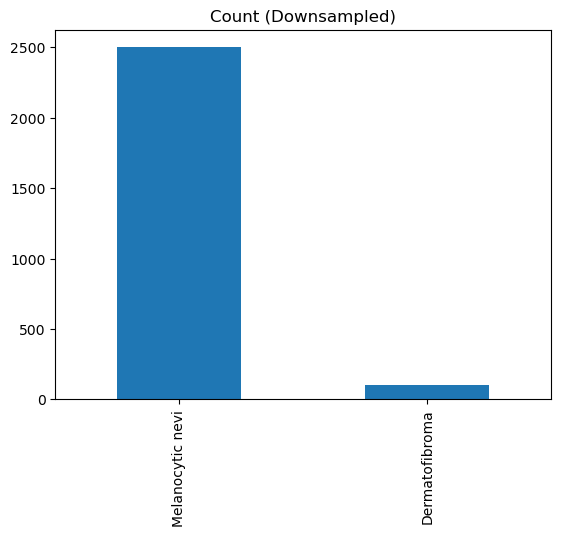

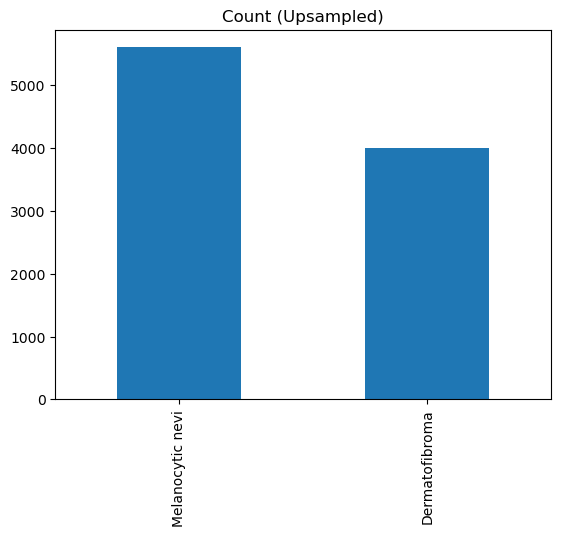

In [18]:
samples_count = skin_train['cell_type'].value_counts()
majority_class = skin_train['cell_type'] == samples_count.idxmax()
minority_class = skin_train['cell_type'] == samples_count.idxmin()

skin_majority = skin_train[majority_class]
skin_minority = skin_train[minority_class]

# Downsample majority class
skin_majority_downsampled = resample(skin_majority, 
                                     replace=False,     # sample without replacement
                                     n_samples=2500,    # to match minority class
                                     random_state=7)  # reproducible results

# Combine majority class with downsampled minority class
skin_downsampled = pd.concat([skin_majority_downsampled, skin_minority])

# Display new class counts after downsampling
skin_downsampled['cell_type'].value_counts().plot(kind='bar', title='Count (Downsampled)')
plt.show()  # To explicitly show the plot

# Upsample minority class
skin_minority_upsampled = resample(skin_minority, 
                                   replace=True,      # sample with replacement
                                   n_samples=4000,    # to match majority class
                                   random_state=7)   # reproducible results

# Combine majority class with upsampled minority class
skin_upsampled = pd.concat([skin_majority, skin_minority_upsampled])

# Display new class counts after upsampling
skin_upsampled['cell_type'].value_counts().plot(kind='bar', title='Count (Upsampled)')
plt.show()  # To explicitly show the plot


In [19]:
skin_train = skin_train[skin_train['cell_type'] != skin_train['cell_type'].value_counts().idxmax()]
skin_train = pd.concat([skin_train, skin_majority_downsampled], sort=True)
print(skin_train['cell_type'].value_counts())

Melanocytic nevi                  2500
dermatofibroma                    1056
Benign keratosis-like lesions      989
Basal cell carcinoma               470
Actinic keratoses                  289
Vascular lesions                   126
Dermatofibroma                     105
Name: cell_type, dtype: int64


<Axes: >

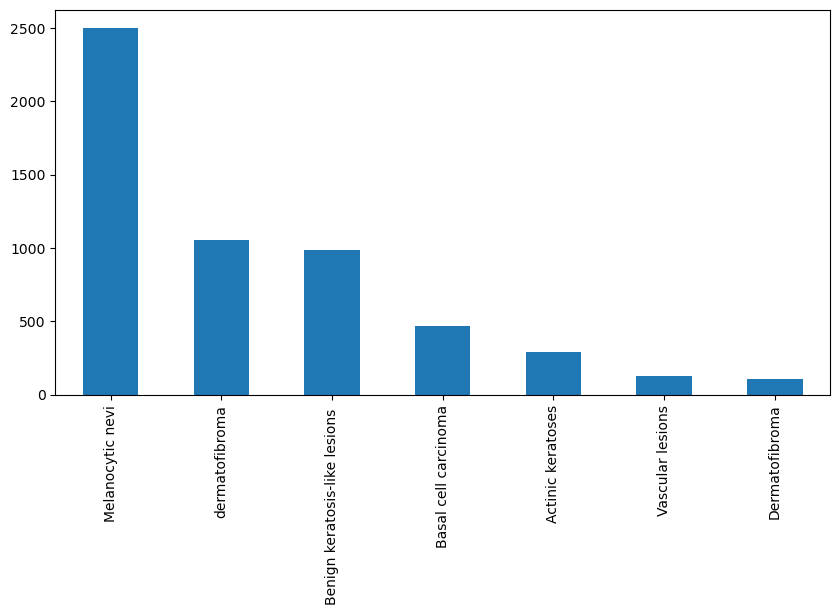

In [20]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
skin_train['cell_type'].value_counts().plot(kind='bar', ax=ax1)

<Axes: >

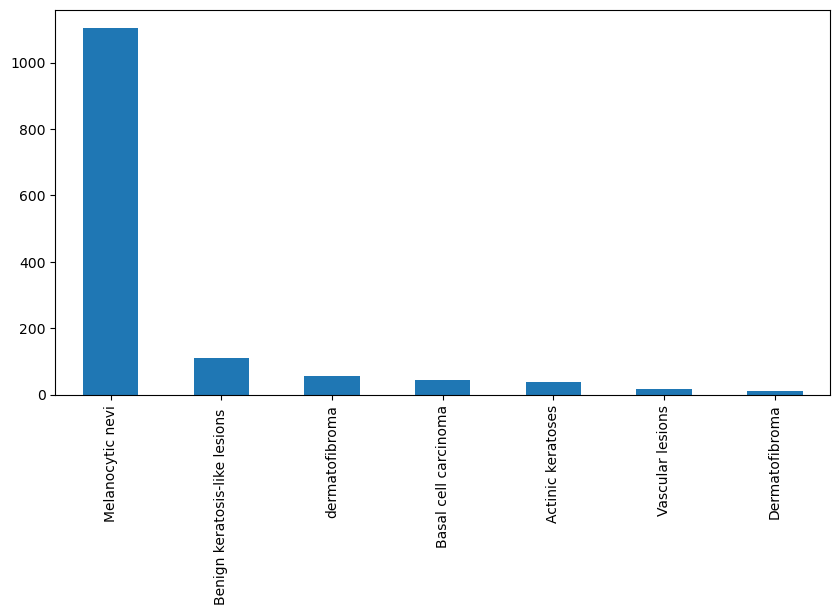

In [21]:
fig, ax1 = plt.subplots(1, 1, figsize= (10, 5))
skin_val['cell_type'].value_counts().plot(kind='bar', ax=ax1)

##### Set features and target

In [22]:
X_train = skin_train['image']
y_train = skin_train['cell_type_idx']

print(X_train.shape)
print(y_train.shape)

(5535,)
(5535,)


In [23]:
#for val
X_val = skin_val['image']
y_val = skin_val['cell_type_idx']

print(X_val.shape)
print(y_val.shape)

(1379,)
(1379,)


In [24]:
X_train = np.stack(X_train.values)  # Convert images into a numpy array
y_train = pd.get_dummies(y_train).values  # One-hot encode labels

X_val = np.stack(X_val.values)  # Convert images into a numpy array
y_val = pd.get_dummies(y_val).values  # One-hot encode labels

In [25]:
X_train.shape

(5535, 450, 600, 3)

In [26]:
# Normalize image
X_train = X_train.astype(np.float32)

x_mean = np.mean(X_train)
x_std = np.std(X_train)

X_train = (X_train - x_mean) / x_std

X_val = (X_val - x_mean) / x_std

In [27]:
# resize image for Model

with tf.device('/CPU:0'):
    X_train = resize(X_train, [224, 224])
    X_val = resize(X_val, [224, 224])

In [28]:
print(X_train.shape)
print(X_val.shape)

(5535, 224, 224, 3)
(1379, 224, 224, 3)


In [29]:
# data aumentation
datagen = ImageDataGenerator(
        featurewise_center=False, 
        samplewise_center=False,  
        featurewise_std_normalization=False, 
        samplewise_std_normalization=False, 
        zca_whitening=False,  
        rotation_range=10, 
        zoom_range = 0.1, 
        width_shift_range=0.1,  
        height_shift_range=0.1, 
        horizontal_flip=False,
        vertical_flip=False)

datagen.fit(X_train)

### Building model

In [30]:
total = 0
class_weights = []
for i in skin_train['cell_type'].value_counts():
    total += i
class_weights = [1 - (i/total) for i in skin_train['cell_type'].value_counts()]

In [31]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
checkpoint = ModelCheckpoint(
    "ResNet.h5", monitor='val_accuracy', verbose=1, 
    save_best_only=True, save_weights_only=False, mode='auto', period=1)

early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=20, verbose=1, mode='auto')
callbacks = [learning_rate_reduction, checkpoint, early]

In [32]:
# Parameters
epochs = 100  
batch_size = 16
classes = 100
model_input = (224, 224, 3)

# Create the base pre-trained model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=model_input)
  
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
num_classes = 7 
predictions = Dense(num_classes, activation='softmax', use_bias=True)(x)



model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=10, 
                                            verbose=1, 
                                            factor=0.75, 
                                            min_lr=0.00001)

# Convert class_weights list to a dictionary
class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}
with tf.device('/GPU:1'):
    history = model.fit(datagen.flow(X_train,y_train, batch_size=batch_size),
                                  class_weight=class_weight_dict,
                                  epochs=epochs, 
                                  validation_data=(X_val, y_val),
                                  verbose=1, 
                                  steps_per_epoch=X_train.shape[0] // batch_size,
                                  callbacks=callbacks)


Epoch 1/100
345/345 [==============================] - ETA: 0s - loss: 1.1495 - accuracy: 0.5066
Epoch 1: val_accuracy improved from -inf to 0.80058, saving model to ResNet.h5
345/345 [==============================] - 58s 137ms/step - loss: 1.1495 - accuracy: 0.5066 - val_loss: 1.4888 - val_accuracy: 0.8006 - lr: 0.0010
Epoch 2/100
345/345 [==============================] - ETA: 0s - loss: 0.9713 - accuracy: 0.5670
Epoch 2: val_accuracy did not improve from 0.80058
345/345 [==============================] - 46s 132ms/step - loss: 0.9713 - accuracy: 0.5670 - val_loss: 1.5196 - val_accuracy: 0.4213 - lr: 0.0010
Epoch 3/100
345/345 [==============================] - ETA: 0s - loss: 0.9026 - accuracy: 0.5950
Epoch 3: val_accuracy did not improve from 0.80058
345/345 [==============================] - 46s 134ms/step - loss: 0.9026 - accuracy: 0.5950 - val_loss: 0.6254 - val_accuracy: 0.7723 - lr: 0.0010
Epoch 4/100
345/345 [==============================] - ETA: 0s - loss: 0.8643 - accurac

345/345 [==============================] - 47s 136ms/step - loss: 0.1525 - accuracy: 0.9335 - val_loss: 0.4831 - val_accuracy: 0.8731 - lr: 6.2500e-05
Epoch 27/100
345/345 [==============================] - ETA: 0s - loss: 0.1259 - accuracy: 0.9456
Epoch 27: val_accuracy did not improve from 0.90210
345/345 [==============================] - 47s 135ms/step - loss: 0.1259 - accuracy: 0.9456 - val_loss: 0.4076 - val_accuracy: 0.8876 - lr: 3.1250e-05
Epoch 28/100
345/345 [==============================] - ETA: 0s - loss: 0.1171 - accuracy: 0.9496
Epoch 28: val_accuracy did not improve from 0.90210
345/345 [==============================] - 47s 135ms/step - loss: 0.1171 - accuracy: 0.9496 - val_loss: 0.4320 - val_accuracy: 0.8825 - lr: 3.1250e-05
Epoch 29/100
345/345 [==============================] - ETA: 0s - loss: 0.1072 - accuracy: 0.9540
Epoch 29: ReduceLROnPlateau reducing learning rate to 1.5625000742147677e-05.

Epoch 29: val_accuracy did not improve from 0.90210
345/345 [=========

#### Evaluate model

In [33]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=1)
train_loss, train_accuracy = model.evaluate(X_train, y_train, verbose=1)
print("Validation: val_accuracy = %f  -  val_loss = %f" % (accuracy, loss))
print("Train: accuracy = %f  -  loss = %f" % (train_accuracy, train_loss))

173/173 [==============================] - 9s 52ms/step - loss: 0.1021 - accuracy: 0.9608
Validation: val_accuracy = 0.885424  -  val_loss = 0.483223
Train: accuracy = 0.960795  -  loss = 0.102087


In [34]:
class_dict = {
    0: 'Actinic keratoses',
    1: 'Basal cell carcinoma',
    2: 'Benign keratosis-like lesions',
    3: 'Dermatofibroma_df',
    4: 'Melanocytic nevi',
    5: 'Vascular lesions',
    6: 'Dermatofibroma_mel' 
}

173/173 [==============================] - 9s 49ms/step


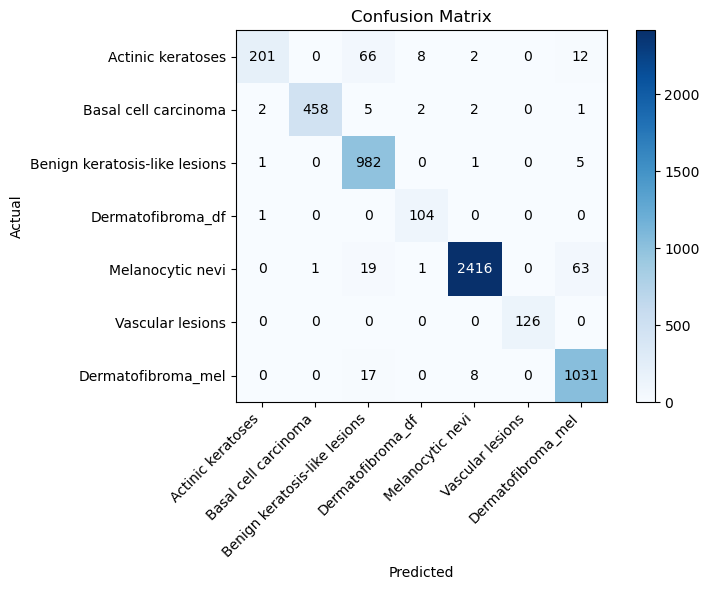

In [35]:
def display_confusion_matrix(true_labels, predicted_labels, class_dict, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    """
    Visualizes the confusion matrix. Set `normalize=True` for normalization.
    """
    # Compute confusion matrix
    matrix = confusion_matrix(true_labels, predicted_labels)
    
    if normalize:
        matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]
    
    plt.figure(figsize=(8,6))
    plt.imshow(matrix, interpolation='nearest', cmap=cmap)
    plt.title(title)
    
    # Show color bar
    plt.colorbar()
    
    # Get class names from the dictionary
    class_names = list(class_dict.values())
    
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45, ha="right")
    plt.yticks(tick_marks, class_names)
    
    # Text annotations inside the cells
    fmt = '.2f' if normalize else 'd'
    thresh = matrix.max() / 2.
    for i, j in enumerate(matrix):
        for k, l in enumerate(j):
            plt.text(k, i, format(l, fmt),
                     ha="center", va="center",
                     color="white" if l > thresh else "black")
    
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

# Get model predictions
predictions = model.predict(X_train)
predicted_classes = np.argmax(predictions, axis=1)
actual_classes = np.argmax(y_train, axis=1)

# Call the function
display_confusion_matrix(actual_classes, predicted_classes, class_dict)


44/44 [==============================] - 2s 48ms/step


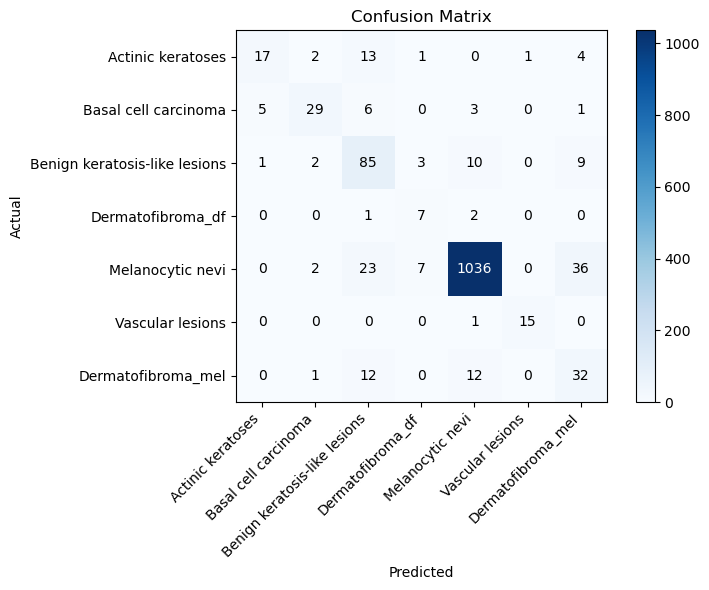

In [36]:
# Plot confusion matrix for validation data

# Get model predictions
predictions = model.predict(X_val)
predicted_classes = np.argmax(predictions, axis=1)
actual_classes = np.argmax(y_val, axis=1)

# Call the function
display_confusion_matrix(actual_classes, predicted_classes, class_dict)


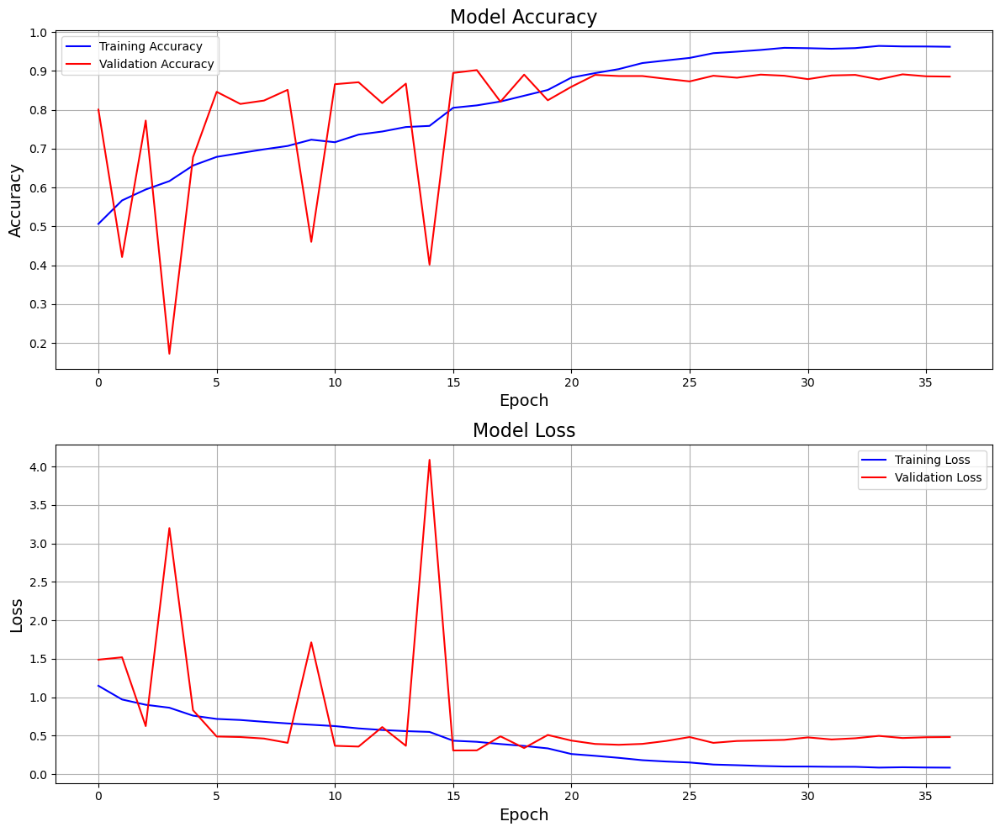

In [37]:
import matplotlib.pyplot as plt

# Assuming history is the return value from the `fit` method
# history = model.fit(...)

# Set up the figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'], color='b', label='Training Accuracy')
ax1.plot(history.history['val_accuracy'], color='r', label='Validation Accuracy')
ax1.set_title('Model Accuracy', fontsize=16)
ax1.set_ylabel('Accuracy', fontsize=14)
ax1.set_xlabel('Epoch', fontsize=14)
ax1.legend(loc='best')
ax1.grid(True)

# Plot training & validation loss values
ax2.plot(history.history['loss'], color='b', label='Training Loss')
ax2.plot(history.history['val_loss'], color='r', label='Validation Loss')
ax2.set_title('Model Loss', fontsize=16)
ax2.set_ylabel('Loss', fontsize=14)
ax2.set_xlabel('Epoch', fontsize=14)
ax2.legend(loc='best')
ax2.grid(True)

plt.tight_layout()

# Save the figure with high dpi
file_name = "accuracy_loss_plot.png"
plt.savefig(file_name, dpi=300)

plt.show()


#### Other evaluation metrics

In [38]:
def compute_metrics(actual, predicted):
    """Compute precision, recall, F1-score, and specificity."""
    metrics = {}

    # 1. Precision
    metrics['Precision'] = precision_score(actual, predicted, average='weighted')
    
    # 2. Recall
    metrics['Recall'] = recall_score(actual, predicted, average='weighted')

    # 3. F1-Score
    metrics['F1 Score'] = f1_score(actual, predicted, average='weighted')

    # 4. Specificity (True Negative Rate)
    def compute_specificity(cm):
        """Compute specificity for each class, given a confusion matrix."""
        specificity_list = []
        for i in range(cm.shape[0]):
            tn = cm[~i, ~i].sum()
            fp = cm[~i, i].sum()
            specificity = tn / (tn + fp)
            specificity_list.append(specificity)
        return np.mean(specificity_list)

    confusion = confusion_matrix(actual, predicted)
    metrics['Specificity'] = compute_specificity(confusion)

    return metrics

# Compute metrics for training data
train_predictions = np.argmax(model.predict(X_train), axis=1)
train_actual = np.argmax(y_train, axis=1)
train_metrics = compute_metrics(train_actual, train_predictions)

# Compute metrics for validation data
val_predictions = np.argmax(model.predict(X_val), axis=1)
val_actual = np.argmax(y_val, axis=1)
val_metrics = compute_metrics(val_actual, val_predictions)

# Convert metrics to dataframe
data = {
    'Train': [train_metrics['Precision'], train_metrics['Recall'], train_metrics['F1 Score'], train_metrics['Specificity']],
    'Validation': [val_metrics['Precision'], val_metrics['Recall'], val_metrics['F1 Score'], val_metrics['Specificity']]
}
df_metrics = pd.DataFrame(data, index=['Precision', 'Recall', 'F1 Score', 'Specificity'])

# Display the dataframe
df_metrics.head()


44/44 [==============================] - 2s 49ms/step


,Train,Validation
Precision,0.963111,0.903841
Recall,0.960795,0.885424
F1 Score,0.960034,0.891399
Specificity,0.919263,0.883220


44/44 [==============================] - 2s 49ms/step


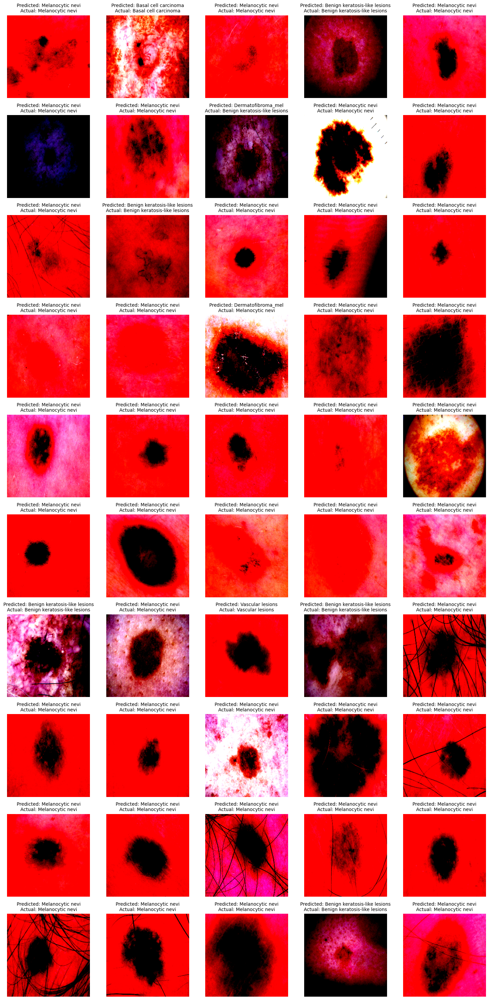

In [39]:
# Randomly select 50 indices
random_indices = np.random.choice(X_val.shape[0], 50, replace=False)
predictions = model.predict(X_val);

# Get the predicted and actual classes
predicted_classes = np.argmax(predictions, axis=1)
actual_classes = np.argmax(y_val, axis=1)

# Initialize a figure with a larger figsize
plt.figure(figsize=(15,30))

# Iterate over the random indices and plot the images
for i, idx in enumerate(random_indices):
    plt.subplot(10, 5, i+1)  # 10 rows and 5 columns
    
    # Use np.clip to make sure the image data is within the valid range
    img_data = np.clip(X_val[idx], 0, 1)
    plt.imshow(img_data)
    
    # Get the actual and predicted classes for this image
    actual_label = class_dict[actual_classes[idx]]
    predicted_label = class_dict[predicted_classes[idx]]
    
    # Set the title to "Predicted: [Predicted Label]\nActual: [Actual Label]"
    plt.title(f"Predicted: {predicted_label}\nActual: {actual_label}", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()


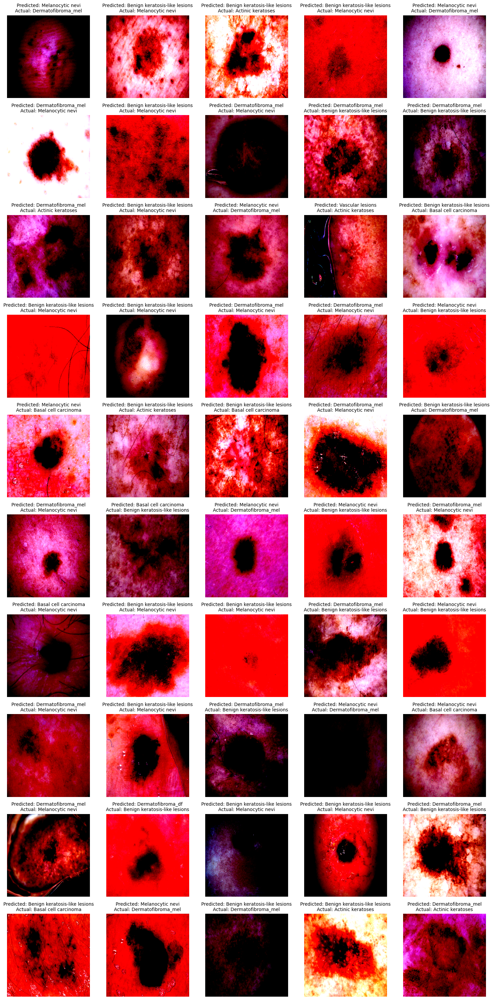

In [40]:
# Find mismatched indices
mismatched_indices = np.where(predicted_classes != actual_classes)[0]

# Randomly select 50 of these indices
num_mismatches = min(50, len(mismatched_indices))
selected_mismatched_indices = np.random.choice(mismatched_indices, num_mismatches, replace=False)

# Initialize a figure with a larger figsize
plt.figure(figsize=(15,30))

# Iterate over the selected mismatched indices and plot the images
for i, idx in enumerate(selected_mismatched_indices):
    plt.subplot(10, 5, i+1)  # 10 rows and 5 columns
    
    # Use np.clip to make sure the image data is within the valid range
    img_data = np.clip(X_val[idx], 0, 1)
    plt.imshow(img_data)
    
    # Get the actual and predicted classes for this image
    actual_label = class_dict[actual_classes[idx]]
    predicted_label = class_dict[predicted_classes[idx]]
    
    # Set the title to "Predicted: [Predicted Label]\nActual: [Actual Label]"
    plt.title(f"Predicted: {predicted_label}\nActual: {actual_label}", fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [41]:
# Save the entire model
model.save('My_skin_lesion_classifier.h5')